In [16]:
#This code is produced to support Chapter 8 of the Phd thesis by Hana Sediva.  Written in December 2023.
#It demonstrates the use of various feature selection models used for all ten target behaviours.
#Specifically, it uses univariate feature selection, feature ranking, correlation matrix, and recursive feature elimination
#with cross validation (RFECV)

In [124]:
#Univariate Selection for Steps feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column i.e garmin steps
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for Steps','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('steps_univariate.xlsx', index=False)

                           Predictors for Steps          Score
19                  ema_steps_goal_number_no_NA  327847.472590
6          ema_breakfast_colourful_rating_no_NA    3146.387804
8              ema_lunch_colourful_rating_no_NA    2424.896402
10            ema_dinner_colourful_rating_no_NA    1648.619666
2                ema_daily_total_education_read     940.100000
3   ema_daily_education_library_accessed_binary     119.060000
14      ema_group_exercise_participation_binary     115.000000
4                         ema_veg_portions_goal     113.968706
12                   ema_had_alcohol_last_night     111.000000
15             ema_morning_exercise_plan_binary     106.000000


[0.02399437 0.04403649 0.02864486 0.02451825 0.08121314 0.06906775
 0.08685487 0.02093649 0.09786574 0.01703602 0.09790023 0.01440148
 0.02603617 0.03116663 0.0268945  0.03034642 0.04031107 0.04012477
 0.02135894 0.07787326 0.03394875 0.0654698 ]


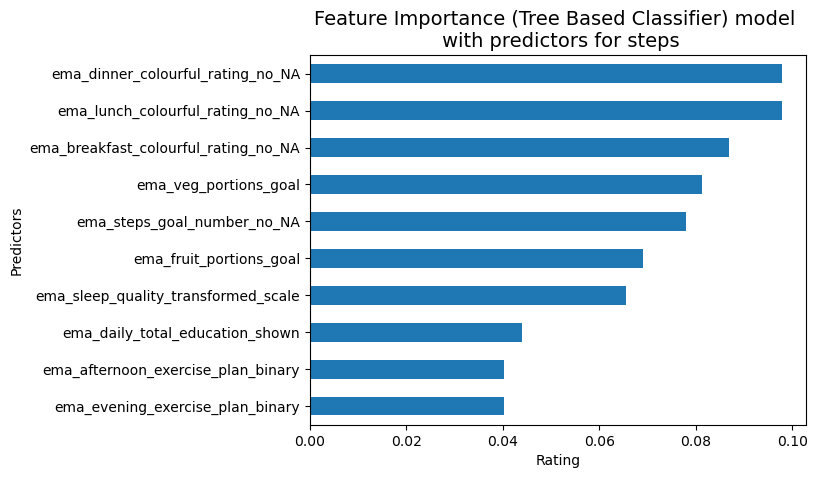

In [100]:
#Feature Importance for Steps
import pandas as pd
import numpy as np
import random
random.seed(10)
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column Garmin steps
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(10).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for steps', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

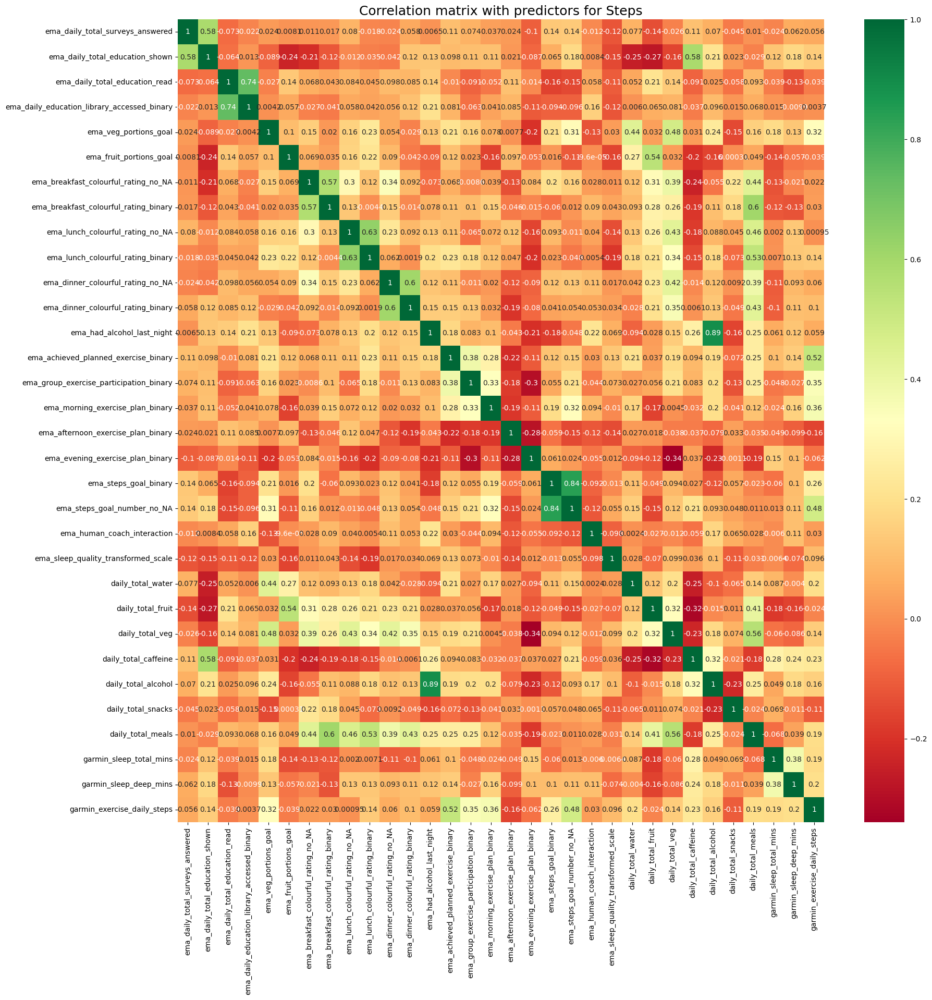

In [63]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column is steps count
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for Steps', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

>knn -4438.403 (938.889)
>cart -4985.835 (1129.880)
>svm -4796.831 (1177.931)
>rfr -3777.701 (862.884)
>gbr -3994.775 (678.400)
>lm -3671.578 (690.924)


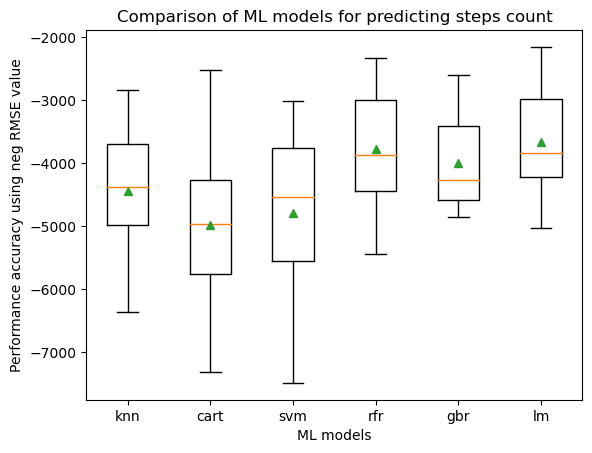

In [17]:
# compare machine learning models for regression for steps count
from numpy import mean
from numpy import std
from sklearn.datasets import make_regression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from matplotlib import pyplot
import pandas as pd

data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
# get the dataset
def get_dataset():
 X = data.iloc[:,0:22]  #independent columns
 y = data.iloc[:,-1]    #target column Garmin steps
 return X, y


# get a list of models to evaluate
def get_models():
 models = dict()
 models['knn'] = KNeighborsRegressor()
 models['cart'] = DecisionTreeRegressor()
 models['svm'] = SVR()
 models['rfr'] = RandomForestRegressor()
 models['gbr'] = GradientBoostingRegressor()
 models['lm'] = LinearRegression()
 return models
 
# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
 cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)
 scores = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=cv, n_jobs=-1, error_score='raise')
 return scores
 
# define dataset
X, y = get_dataset()
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
 scores = evaluate_model(model, X, y)
 results.append(scores)
 names.append(name)
 print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.title('Comparison of ML models for predicting steps count')
pyplot.ylabel('Performance accuracy using neg RMSE value')
pyplot.xlabel('ML models')
pyplot.show()

Optimum number of features: 6
Selected feature names: ['ema_veg_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_achieved_planned_exercise_binary' 'ema_steps_goal_number_no_NA']


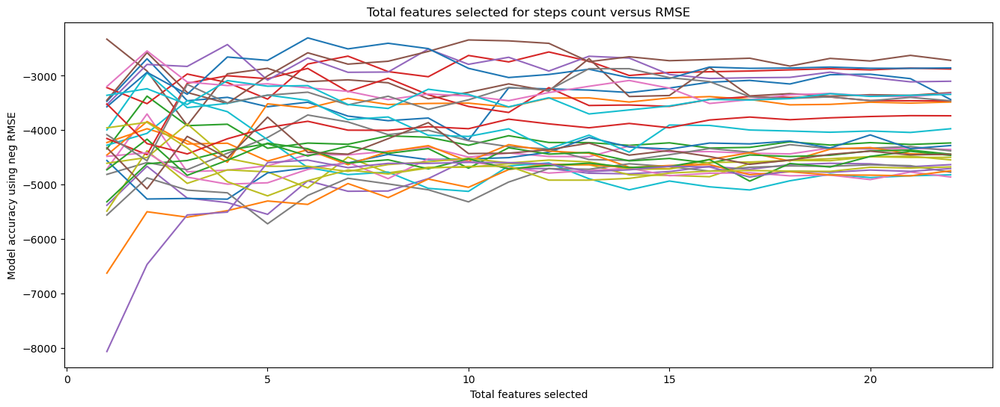

,Rank
ema_dinner_colourful_rating_no_NA,1
ema_steps_goal_number_no_NA,1
ema_achieved_planned_exercise_binary,1
ema_lunch_colourful_rating_no_NA,1
ema_veg_portions_goal,1
ema_breakfast_colourful_rating_no_NA,1
ema_daily_total_surveys_answered,2
ema_fruit_portions_goal,3
ema_group_exercise_participation_binary,4
ema_daily_total_education_shown,5


In [21]:
#using RFE feature selection for steps
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(123)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-1]    #target column Garmin steps

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for steps count versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)


In [13]:
#Univariate Selection for total sleep feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column i.e garmin total sleep minutes
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for Total Sleep minutes','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('total_sleep_univariate.xlsx', index=False)

             Predictors for Total Sleep minutes          Score
19                  ema_steps_goal_number_no_NA  264546.061818
6          ema_breakfast_colourful_rating_no_NA    2609.291233
8              ema_lunch_colourful_rating_no_NA    2167.105047
10            ema_dinner_colourful_rating_no_NA    1315.442199
2                ema_daily_total_education_read     878.966667
3   ema_daily_education_library_accessed_binary     103.380000
14      ema_group_exercise_participation_binary      95.859375
4                         ema_veg_portions_goal      92.082504
12                   ema_had_alcohol_last_night      89.902778
15             ema_morning_exercise_plan_binary      81.500000


[0.02375744 0.05065847 0.02460516 0.02054155 0.07859367 0.0695843
 0.09526891 0.02014664 0.09394893 0.01369743 0.09678383 0.01313265
 0.03121474 0.03192698 0.02838967 0.03480888 0.03115296 0.04085699
 0.02303949 0.07840518 0.04100928 0.05847686]


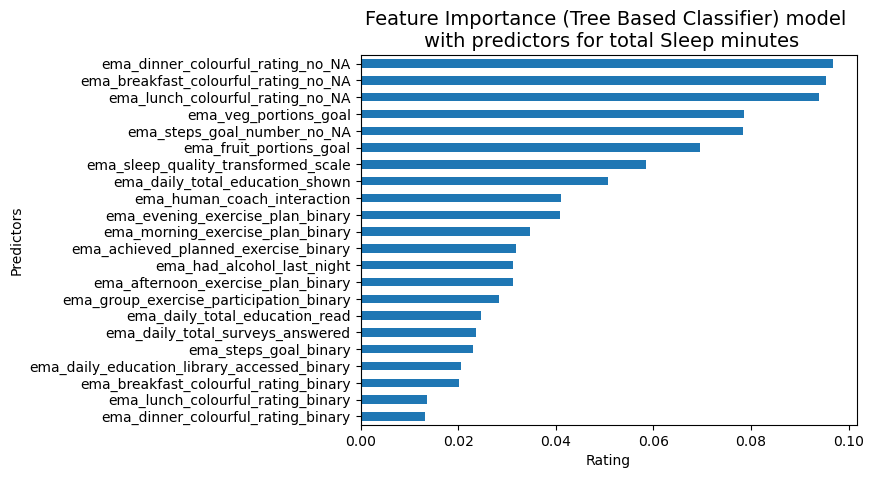

In [108]:
#Feature Importance for total sleep
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column total sleep
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for total Sleep minutes', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

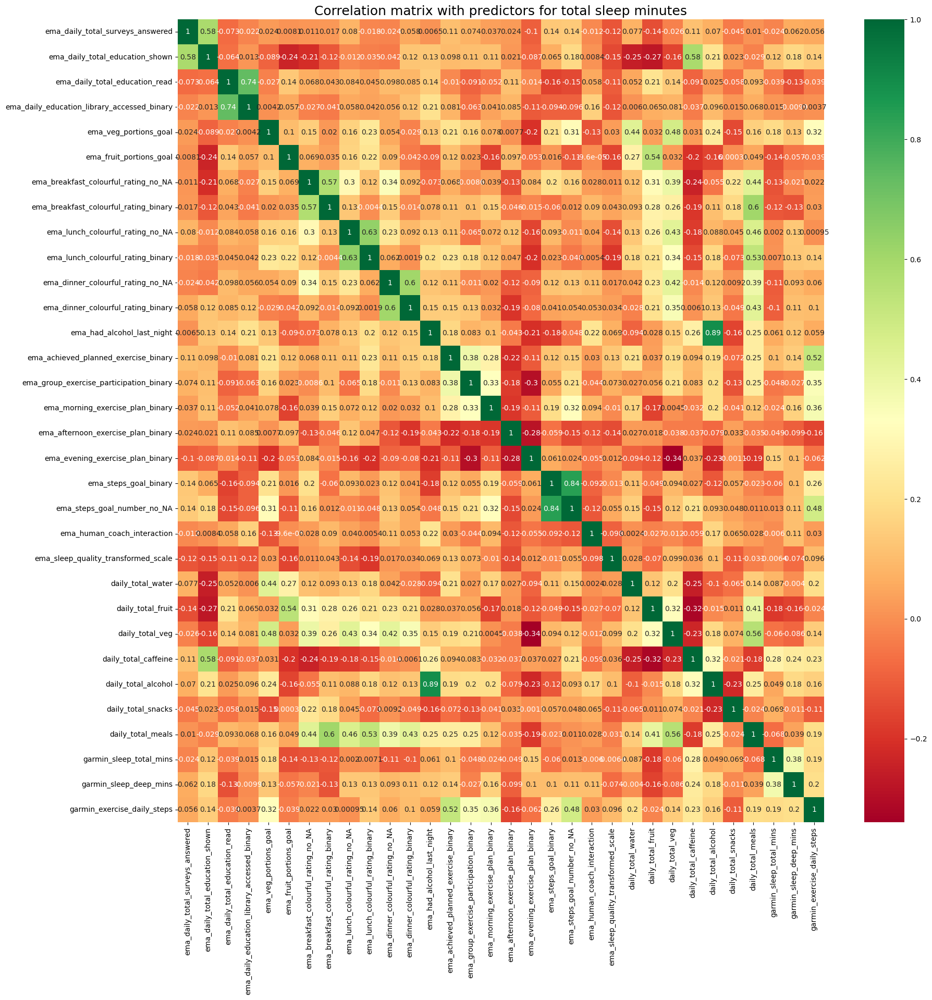

In [66]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column total sleep
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for total sleep minutes', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 7
Selected feature names: ['ema_daily_total_education_shown' 'ema_veg_portions_goal'
 'ema_fruit_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_steps_goal_number_no_NA']


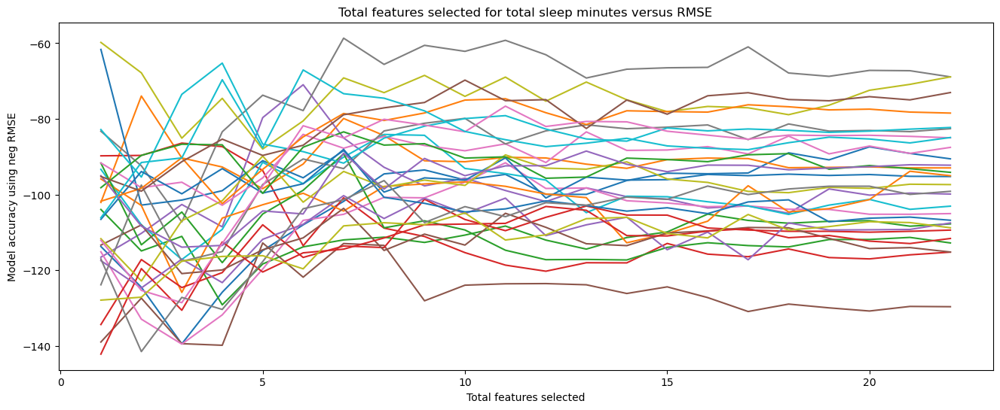

,Rank
ema_dinner_colourful_rating_no_NA,1
ema_daily_total_education_shown,1
ema_steps_goal_number_no_NA,1
ema_veg_portions_goal,1
ema_fruit_portions_goal,1
ema_breakfast_colourful_rating_no_NA,1
ema_lunch_colourful_rating_no_NA,1
ema_evening_exercise_plan_binary,2
ema_group_exercise_participation_binary,3
ema_sleep_quality_transformed_scale,4


In [35]:
#using RFE feature selection for total sleep
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(200)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-3]    #target column total sleep

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for total sleep minutes versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [126]:
#Univariate Selection for Deep Sleep feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column garmin deep sleep minutes
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for Deep Sleep minutes','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('deep_sleep_univariate.xlsx', index=False)

              Predictors for Deep Sleep minutes          Score
19                  ema_steps_goal_number_no_NA  272357.145347
6          ema_breakfast_colourful_rating_no_NA    2314.908420
8              ema_lunch_colourful_rating_no_NA    1854.849855
10            ema_dinner_colourful_rating_no_NA    1313.534809
2                ema_daily_total_education_read     818.650000
14      ema_group_exercise_participation_binary      94.710937
3   ema_daily_education_library_accessed_binary      94.560000
4                         ema_veg_portions_goal      91.786273
15             ema_morning_exercise_plan_binary      89.567073
12                   ema_had_alcohol_last_night      86.159722


[0.01831463 0.04798186 0.02560078 0.0218927  0.07849007 0.06733393
 0.09293764 0.02431317 0.09067288 0.01480905 0.09771642 0.01216701
 0.03190888 0.03504278 0.0255346  0.02916542 0.04013048 0.03992111
 0.02314576 0.07924961 0.03685837 0.06681286]


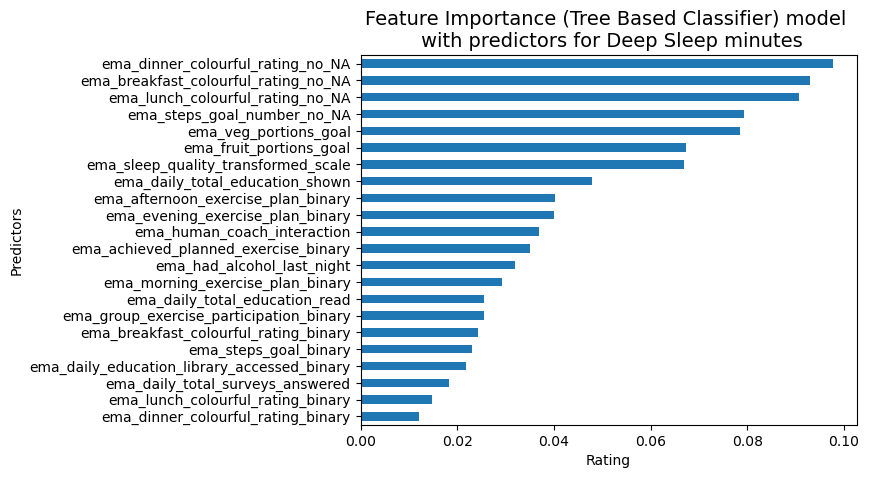

In [104]:
#Feature Importance for Deep Sleep
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column Deep Sleep
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for Deep Sleep minutes', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

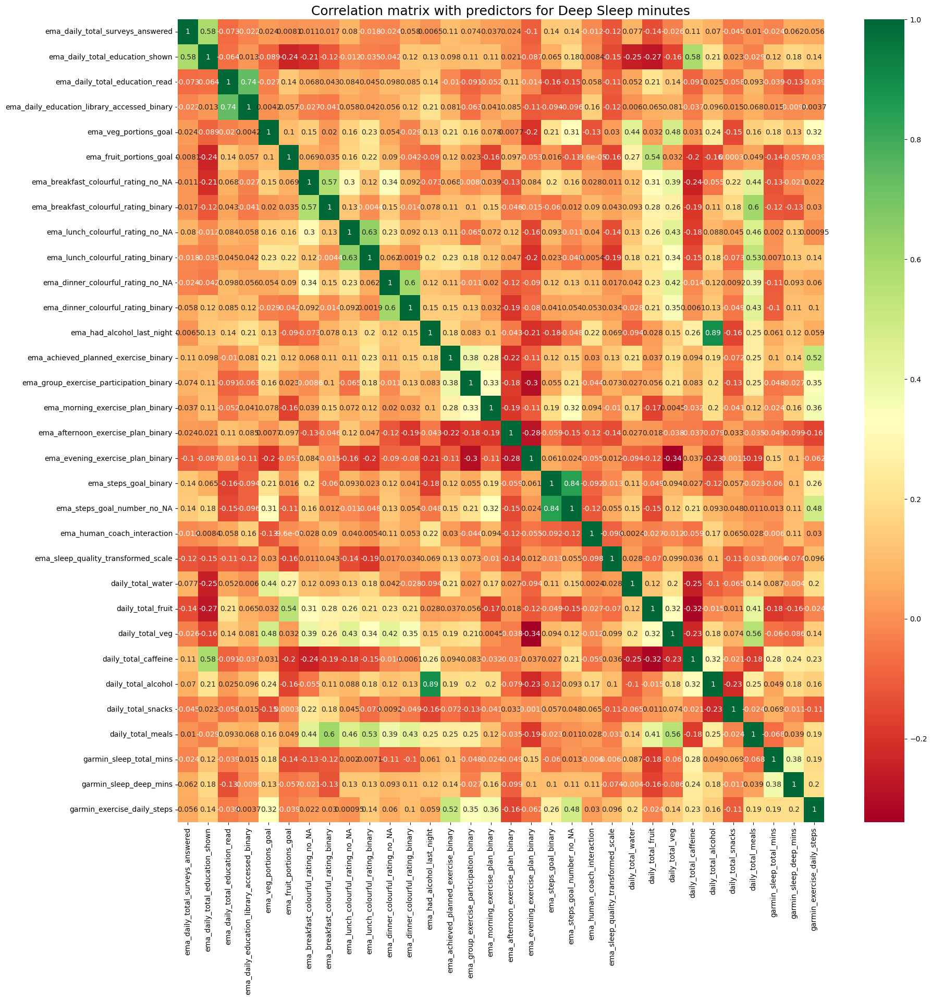

In [69]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column Deep Sleep minutes
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for Deep Sleep minutes', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 4
Selected feature names: ['ema_breakfast_colourful_rating_no_NA' 'ema_lunch_colourful_rating_no_NA'
 'ema_dinner_colourful_rating_no_NA' 'ema_steps_goal_number_no_NA']


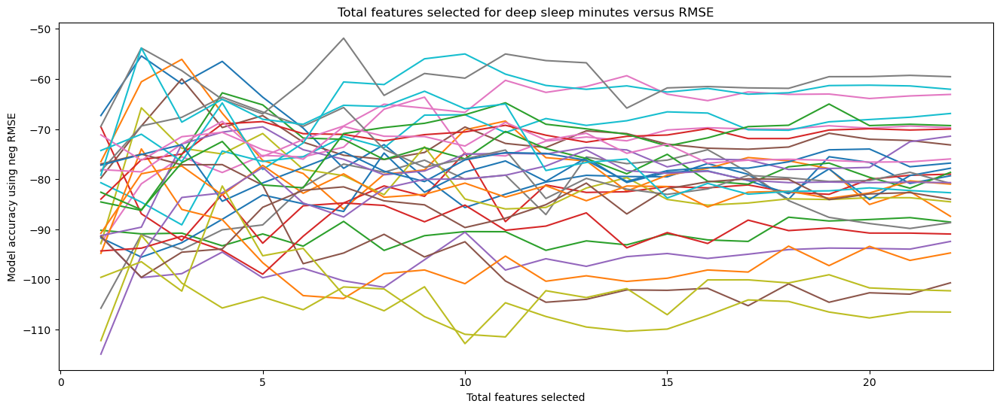

,Rank
ema_dinner_colourful_rating_no_NA,1
ema_steps_goal_number_no_NA,1
ema_breakfast_colourful_rating_no_NA,1
ema_lunch_colourful_rating_no_NA,1
ema_veg_portions_goal,2
ema_afternoon_exercise_plan_binary,3
ema_daily_total_education_shown,4
ema_daily_total_education_read,5
ema_fruit_portions_goal,6
ema_had_alcohol_last_night,7


In [36]:
#using RFE feature selection for deep sleep
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(300)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-2]    #target column deep sleep

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for deep sleep minutes versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [146]:
#Univariate Selection for Fruit feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column fruit portions
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for portions of Fruit','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('fruit_univariate.xlsx', index=False)

               Predictors for portions of Fruit         Score
19                  ema_steps_goal_number_no_NA  24980.188274
6          ema_breakfast_colourful_rating_no_NA    538.533071
8              ema_lunch_colourful_rating_no_NA    403.964679
2                ema_daily_total_education_read    349.689776
10            ema_dinner_colourful_rating_no_NA    168.881773
5                       ema_fruit_portions_goal     15.228267
15             ema_morning_exercise_plan_binary     11.126966
14      ema_group_exercise_participation_binary     10.657237
3   ema_daily_education_library_accessed_binary     10.030419
17             ema_evening_exercise_plan_binary     10.008471


[0.02488834 0.04665649 0.03060134 0.0236638  0.07226349 0.07969083
 0.08231502 0.02539474 0.0828324  0.01594654 0.08948465 0.02001967
 0.0296391  0.04229642 0.02421709 0.03003039 0.03675259 0.03626602
 0.02513034 0.08054928 0.03773453 0.06362691]


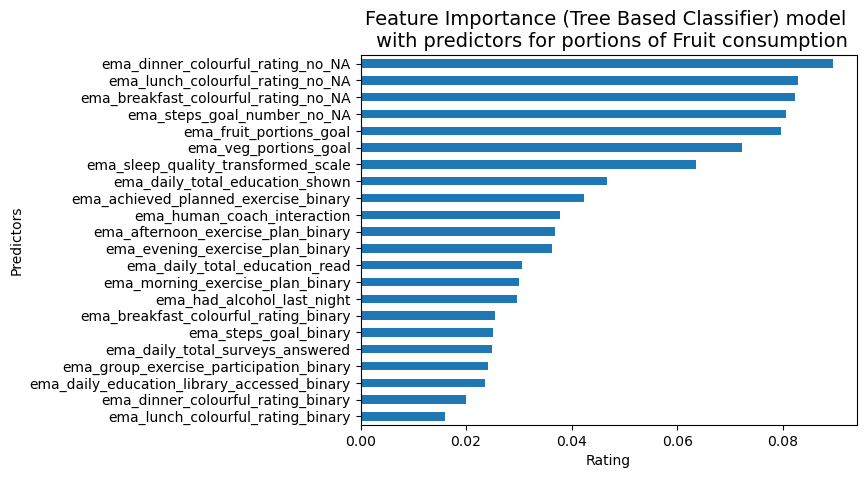

In [123]:
#Feature Importance for Fruit
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column fruit
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for portions of Fruit consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()


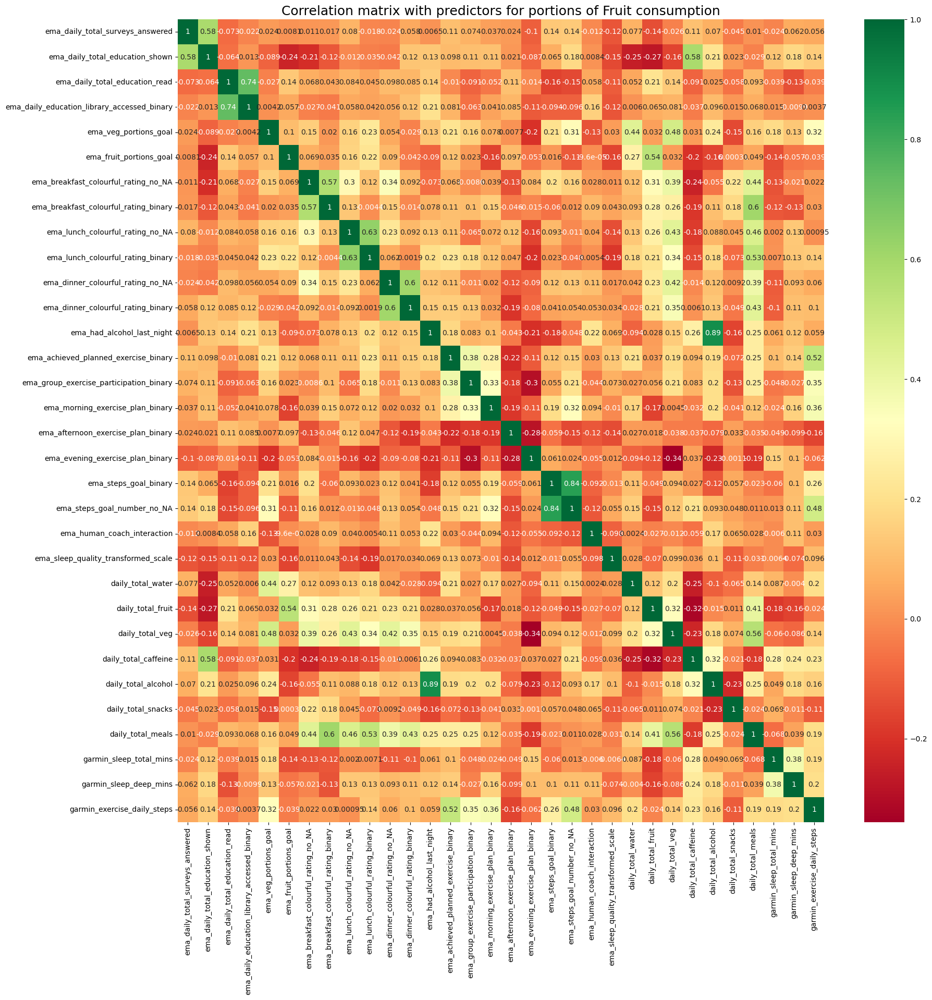

In [72]:
#Correlation Matrix with Heatmap
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column Fruit portions
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for portions of Fruit consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 3
Selected feature names: ['ema_fruit_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_dinner_colourful_rating_no_NA']


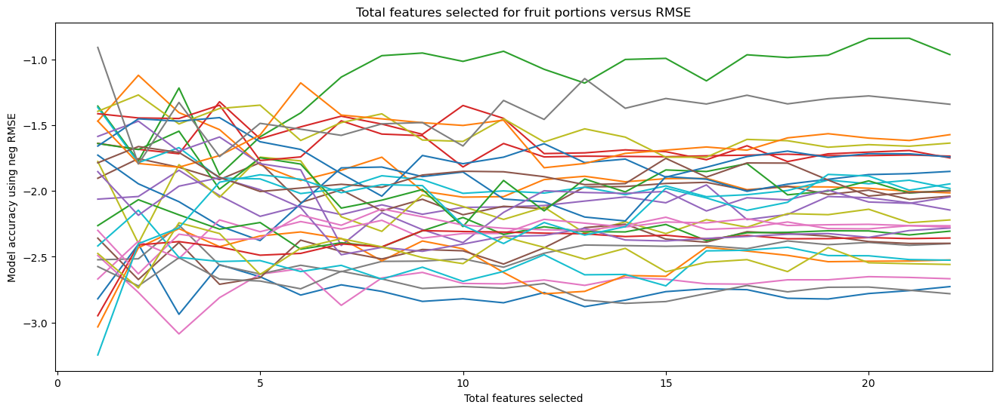

,Rank
ema_dinner_colourful_rating_no_NA,1
ema_breakfast_colourful_rating_no_NA,1
ema_fruit_portions_goal,1
ema_steps_goal_number_no_NA,2
ema_lunch_colourful_rating_no_NA,3
ema_daily_total_surveys_answered,4
ema_veg_portions_goal,5
ema_sleep_quality_transformed_scale,6
ema_morning_exercise_plan_binary,7
ema_dinner_colourful_rating_binary,8


In [37]:
#using RFE feature selection for fruit portions
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(400)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-9]    #target column fruit portions

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for fruit portions versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [127]:
#Univariate Selection for Veg feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg portions
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for portions of Vegetables','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('veg_univariate.xlsx', index=False)

          Predictors for portions of Vegetables         Score
19                  ema_steps_goal_number_no_NA  23788.472858
6          ema_breakfast_colourful_rating_no_NA    676.082716
8              ema_lunch_colourful_rating_no_NA    588.140717
10            ema_dinner_colourful_rating_no_NA    511.806061
2                ema_daily_total_education_read     72.065614
4                         ema_veg_portions_goal     38.811038
17             ema_evening_exercise_plan_binary     20.816964
12                   ema_had_alcohol_last_night     20.542227
3   ema_daily_education_library_accessed_binary     11.765474
13         ema_achieved_planned_exercise_binary     11.229684


[0.02422938 0.04862285 0.02363426 0.02468081 0.08303881 0.06547153
 0.08823264 0.02164595 0.08946263 0.01897889 0.09064096 0.01532442
 0.03430795 0.03542613 0.02643815 0.03528569 0.03614038 0.03812273
 0.02284273 0.07922695 0.04092698 0.0573192 ]


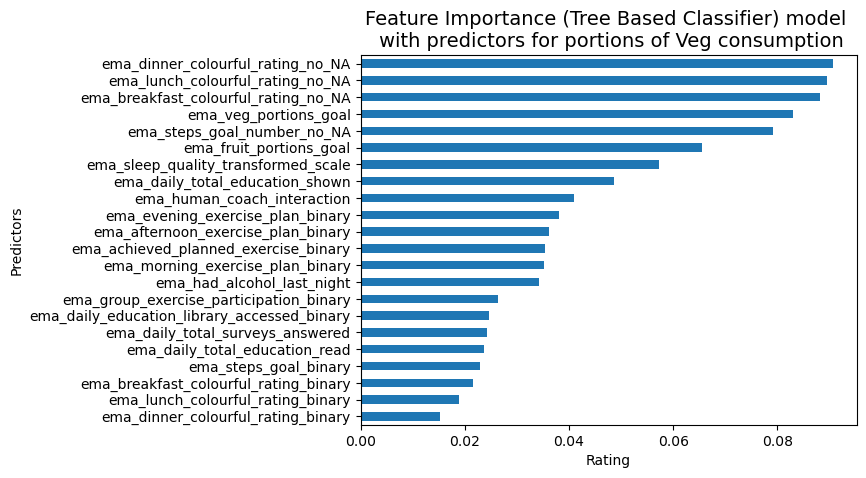

In [128]:
#Feature Importance for veg
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for portions of Veg consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

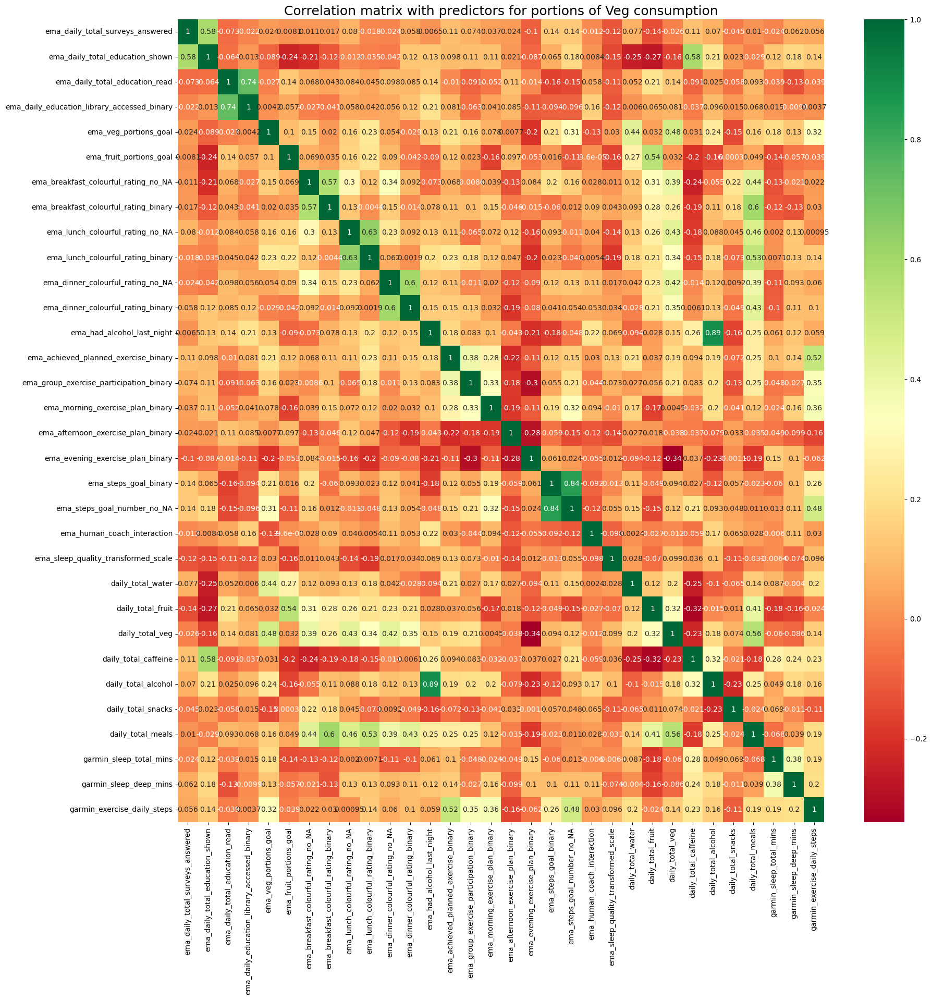

In [75]:
#Correlation Matrix with Heatmap for portions of vegetables
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg portions
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for portions of Veg consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 20
Selected feature names: ['ema_daily_total_surveys_answered' 'ema_daily_total_education_shown'
 'ema_daily_total_education_read'
 'ema_daily_education_library_accessed_binary' 'ema_veg_portions_goal'
 'ema_fruit_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_dinner_colourful_rating_binary' 'ema_had_alcohol_last_night'
 'ema_achieved_planned_exercise_binary'
 'ema_group_exercise_participation_binary'
 'ema_morning_exercise_plan_binary' 'ema_afternoon_exercise_plan_binary'
 'ema_evening_exercise_plan_binary' 'ema_steps_goal_binary'
 'ema_steps_goal_number_no_NA' 'ema_human_coach_interaction'
 'ema_sleep_quality_transformed_scale']


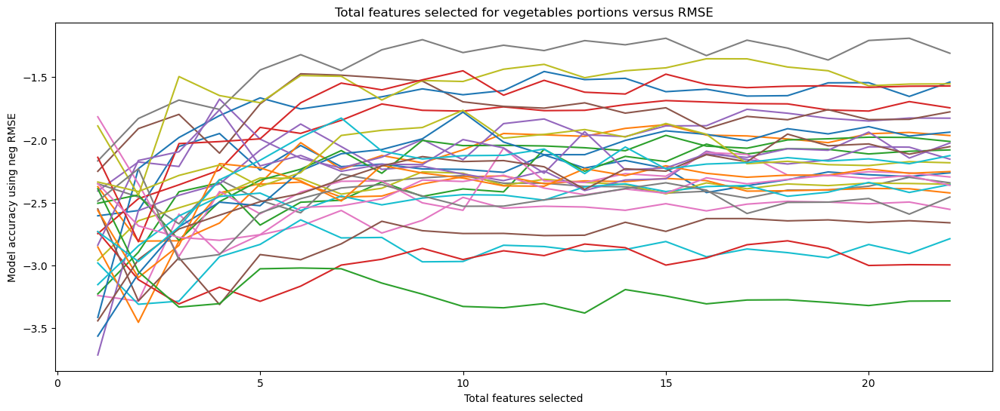

,Rank
ema_daily_total_surveys_answered,1
ema_steps_goal_number_no_NA,1
ema_steps_goal_binary,1
ema_evening_exercise_plan_binary,1
ema_afternoon_exercise_plan_binary,1
ema_morning_exercise_plan_binary,1
ema_group_exercise_participation_binary,1
ema_achieved_planned_exercise_binary,1
ema_had_alcohol_last_night,1
ema_dinner_colourful_rating_binary,1


In [39]:
#using RFE feature selection for veg portions
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(500)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-8]    #target column veg portions

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for vegetables portions versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [129]:
#Univariate Selection for Water feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water glasses
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for glasses of water consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('water_univariate.xlsx', index=False)

    Predictors for glasses of water consumption         Score
19                  ema_steps_goal_number_no_NA  31617.904291
8              ema_lunch_colourful_rating_no_NA    217.393040
6          ema_breakfast_colourful_rating_no_NA    174.036670
2                ema_daily_total_education_read    148.409559
10            ema_dinner_colourful_rating_no_NA     98.069156
4                         ema_veg_portions_goal     37.967660
3   ema_daily_education_library_accessed_binary     14.843382
15             ema_morning_exercise_plan_binary     12.214939
12                   ema_had_alcohol_last_night      8.356924
20                  ema_human_coach_interaction      7.919118


[0.02349191 0.04645777 0.03515223 0.02565447 0.09924602 0.07511963
 0.08203801 0.02326051 0.08491291 0.01877834 0.08640698 0.00979925
 0.03200938 0.03308767 0.02318358 0.03181851 0.03909678 0.03466625
 0.0243871  0.07288147 0.03597842 0.0625728 ]


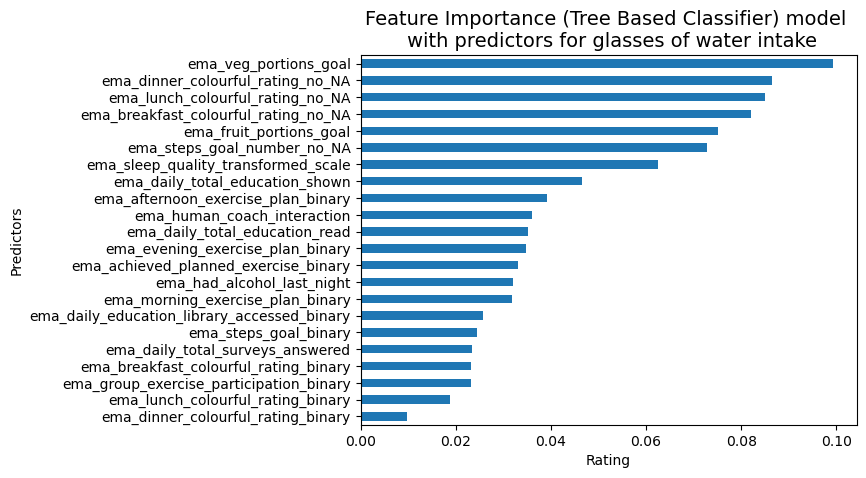

In [131]:
#Feature Importance for water
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water glasses
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for glasses of water intake', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

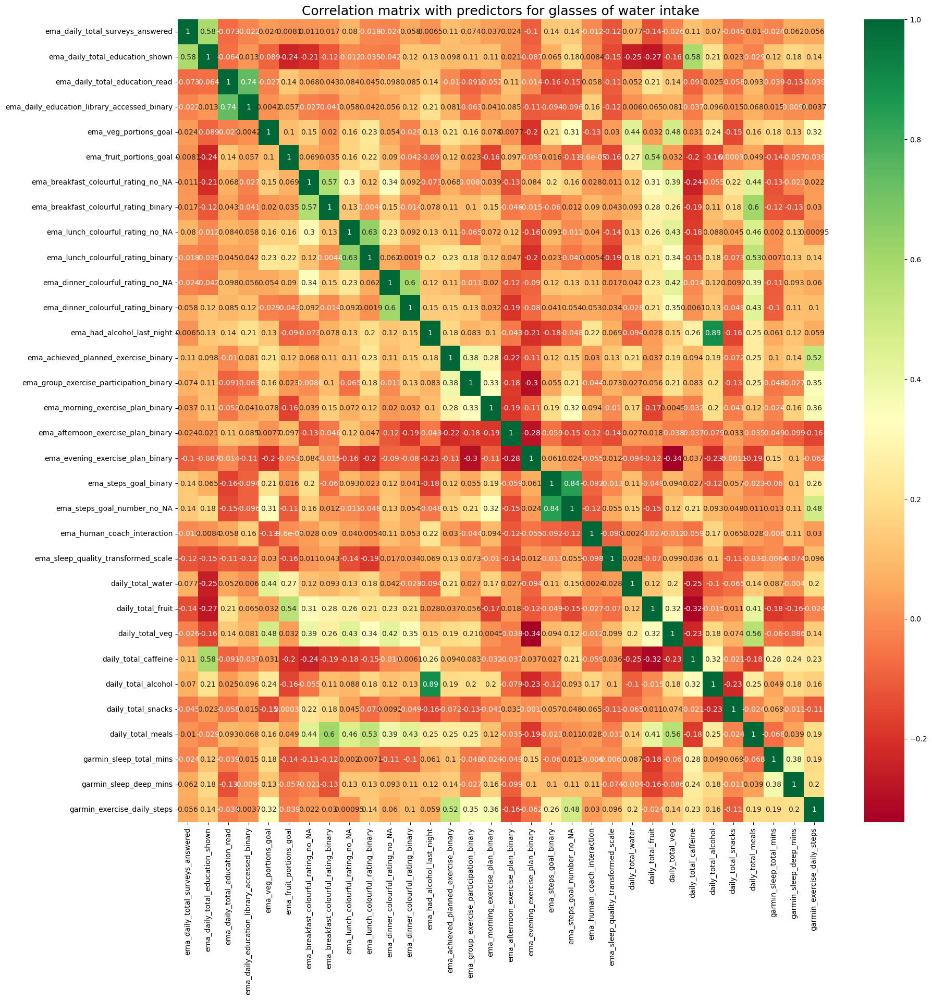

In [78]:
#Correlation Matrix with Heatmap for glasses of water
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water glasses
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for glasses of water intake', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 14
Selected feature names: ['ema_daily_total_surveys_answered' 'ema_daily_total_education_shown'
 'ema_daily_total_education_read' 'ema_veg_portions_goal'
 'ema_fruit_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_had_alcohol_last_night' 'ema_morning_exercise_plan_binary'
 'ema_afternoon_exercise_plan_binary' 'ema_evening_exercise_plan_binary'
 'ema_steps_goal_number_no_NA' 'ema_sleep_quality_transformed_scale']


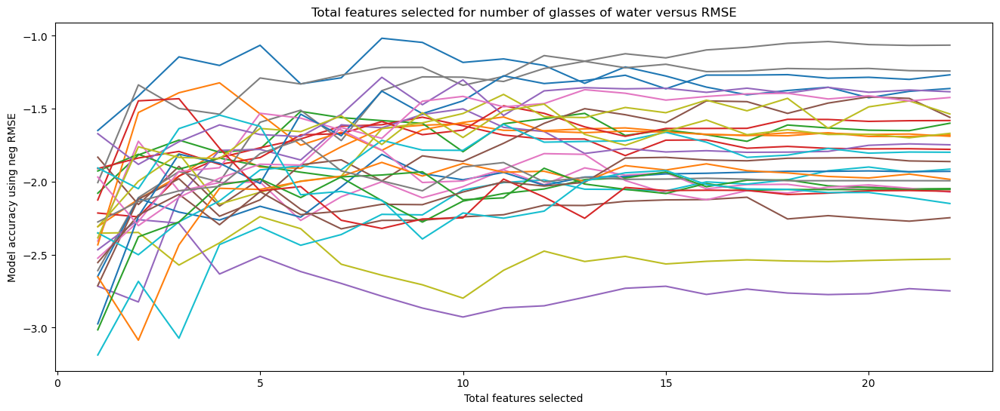

,Rank
ema_daily_total_surveys_answered,1
ema_steps_goal_number_no_NA,1
ema_evening_exercise_plan_binary,1
ema_afternoon_exercise_plan_binary,1
ema_morning_exercise_plan_binary,1
ema_had_alcohol_last_night,1
ema_lunch_colourful_rating_no_NA,1
ema_dinner_colourful_rating_no_NA,1
ema_breakfast_colourful_rating_no_NA,1
ema_fruit_portions_goal,1


In [40]:
#using RFE feature selection for water glasses
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(600)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-10]    #target column water glasses

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for number of glasses of water versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [132]:
#Univariate Selection for Caffeine feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column caffeine cups
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for cups of Coffee intake','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('caffeine_univariate.xlsx', index=False)

       Predictors for cups of Coffee intake         Score
19              ema_steps_goal_number_no_NA  18090.109980
6      ema_breakfast_colourful_rating_no_NA    300.480150
8          ema_lunch_colourful_rating_no_NA    273.216216
10        ema_dinner_colourful_rating_no_NA     88.944773
2            ema_daily_total_education_read     22.473818
4                     ema_veg_portions_goal     11.869682
12               ema_had_alcohol_last_night     10.335758
1           ema_daily_total_education_shown      6.378251
14  ema_group_exercise_participation_binary      5.128239
16       ema_afternoon_exercise_plan_binary      4.570158


[0.03360324 0.12135406 0.02248226 0.02376501 0.08777253 0.06832468
 0.08607956 0.01837266 0.07092232 0.02244507 0.0731783  0.01102311
 0.03108247 0.03295119 0.0240834  0.03500934 0.02922412 0.03073906
 0.02104344 0.07765159 0.03005514 0.04883746]


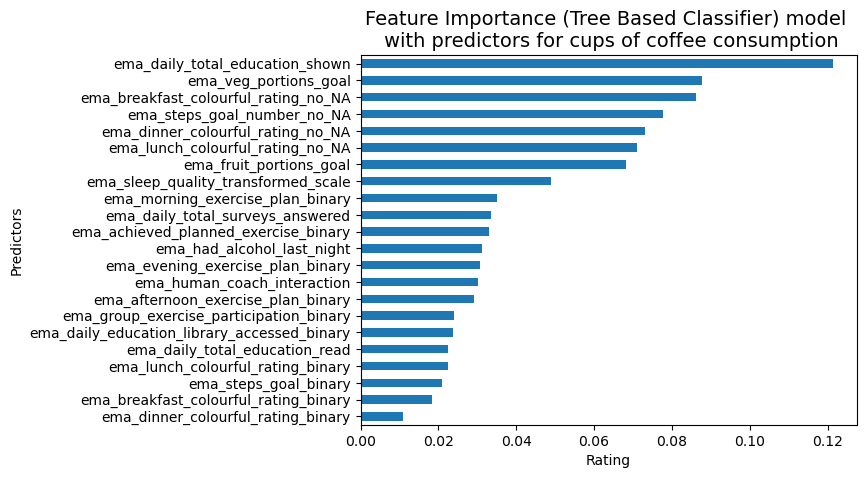

In [133]:
#Feature Importance for caffeine
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column caffeine cups
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(23).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for cups of coffee consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

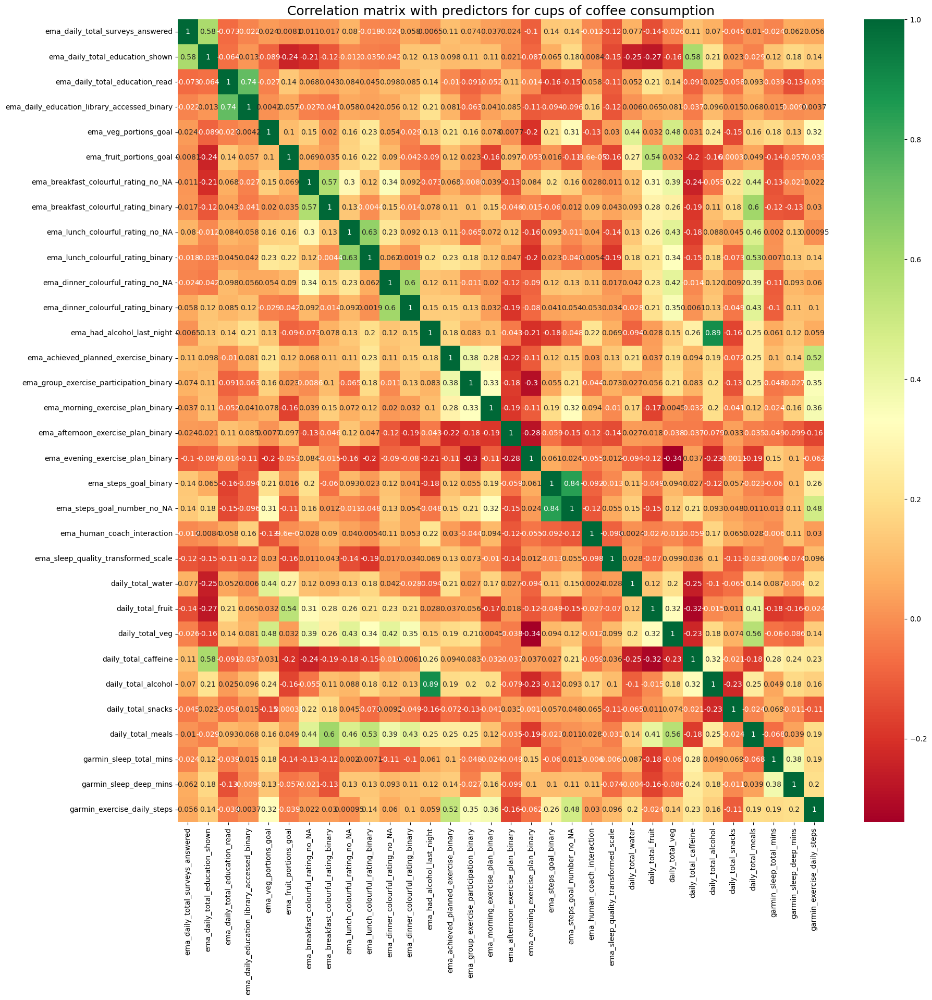

In [81]:
#Correlation Matrix with Heatmap for cups of coffee
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column caffeine cups
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for cups of coffee consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 12
Selected feature names: ['ema_daily_total_surveys_answered' 'ema_daily_total_education_shown'
 'ema_daily_total_education_read' 'ema_veg_portions_goal'
 'ema_fruit_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_breakfast_colourful_rating_binary'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_had_alcohol_last_night' 'ema_morning_exercise_plan_binary'
 'ema_steps_goal_number_no_NA']


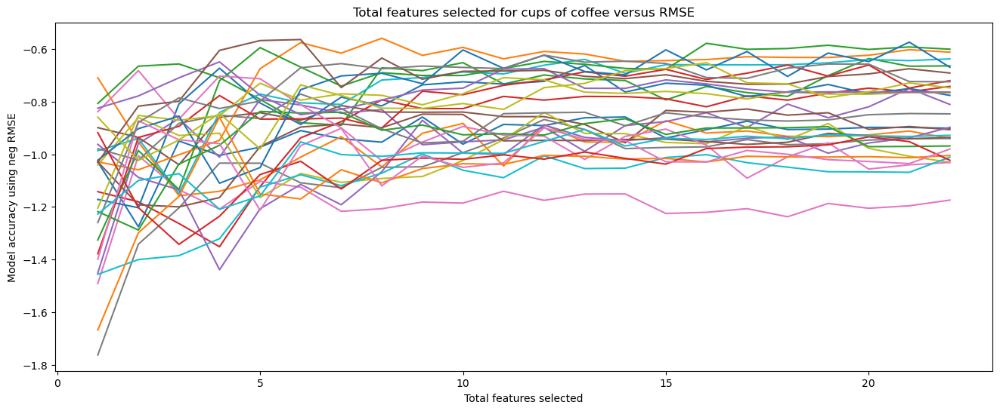

,Rank
ema_daily_total_surveys_answered,1
ema_steps_goal_number_no_NA,1
ema_morning_exercise_plan_binary,1
ema_had_alcohol_last_night,1
ema_lunch_colourful_rating_no_NA,1
ema_breakfast_colourful_rating_binary,1
ema_dinner_colourful_rating_no_NA,1
ema_fruit_portions_goal,1
ema_veg_portions_goal,1
ema_daily_total_education_read,1


In [41]:
#using RFE feature selection for coffee cups
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(700)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-7]    #target column coffee cups

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for cups of coffee versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [137]:
#Univariate Selection for alcohol feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column alcohol
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for units of alcoholic beverages consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('alcohol_univariate.xlsx', index=False)

   Predictors for units of alcoholic beverages consumption         Score
19                        ema_steps_goal_number_no_NA       40485.696573
6                ema_breakfast_colourful_rating_no_NA         135.195504
12                         ema_had_alcohol_last_night         111.000000
8                    ema_lunch_colourful_rating_no_NA         101.818845
2                      ema_daily_total_education_read          94.580405
10                  ema_dinner_colourful_rating_no_NA          30.716159
14            ema_group_exercise_participation_binary          13.104624
3         ema_daily_education_library_accessed_binary          13.067703
4                               ema_veg_portions_goal          12.404757
20                        ema_human_coach_interaction          10.710250


[0.01373095 0.02586146 0.0221662  0.0266565  0.03603955 0.03497836
 0.05005422 0.01266565 0.05492256 0.00422981 0.04415016 0.00157255
 0.40084689 0.02695224 0.02677064 0.02621476 0.01524994 0.01695443
 0.01658982 0.05832259 0.03811088 0.04695981]


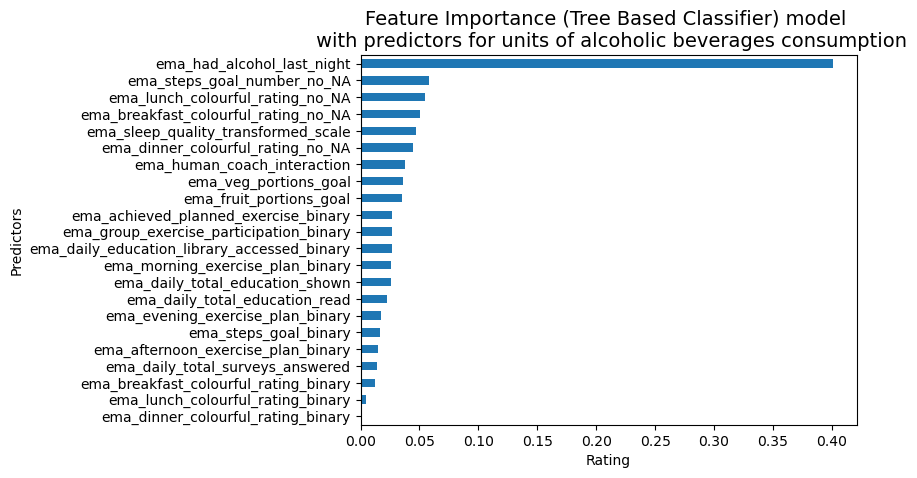

In [142]:
#Feature Importance for alcohol
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column alcohol
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for units of alcoholic beverages consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

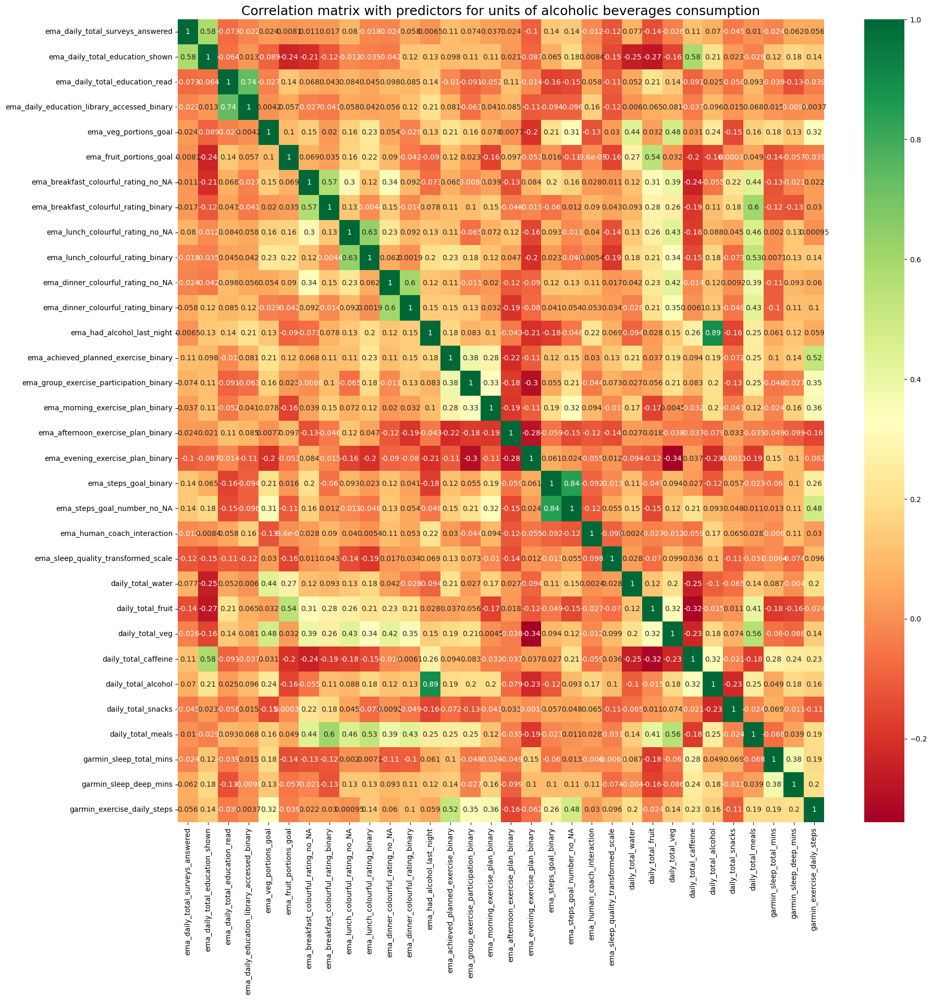

In [84]:
#Correlation Matrix with Heatmap for units of alcohol
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column units of alcohol
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for units of alcoholic beverages consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 15
Selected feature names: ['ema_daily_total_education_shown' 'ema_daily_total_education_read'
 'ema_veg_portions_goal' 'ema_fruit_portions_goal'
 'ema_breakfast_colourful_rating_no_NA'
 'ema_breakfast_colourful_rating_binary'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_had_alcohol_last_night' 'ema_achieved_planned_exercise_binary'
 'ema_group_exercise_participation_binary' 'ema_steps_goal_binary'
 'ema_steps_goal_number_no_NA' 'ema_human_coach_interaction'
 'ema_sleep_quality_transformed_scale']


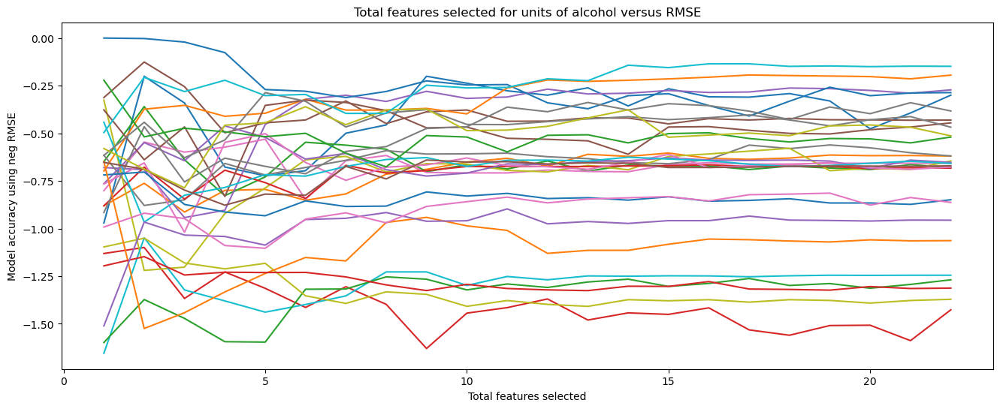

,Rank
ema_dinner_colourful_rating_no_NA,1
ema_steps_goal_number_no_NA,1
ema_steps_goal_binary,1
ema_group_exercise_participation_binary,1
ema_achieved_planned_exercise_binary,1
ema_had_alcohol_last_night,1
ema_human_coach_interaction,1
ema_lunch_colourful_rating_no_NA,1
ema_sleep_quality_transformed_scale,1
ema_breakfast_colourful_rating_no_NA,1


In [42]:
#using RFE feature selection for units of alcohol
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(800)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-6]    #target column units of alcohol

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for units of alcohol versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [140]:
#Univariate Selection for snacks feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for portions of snacks consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('snacks_univariate.xlsx', index=False)

   Predictors for portions of snacks consumption         Score
19                   ema_steps_goal_number_no_NA  25153.578331
6           ema_breakfast_colourful_rating_no_NA    289.580549
10             ema_dinner_colourful_rating_no_NA    116.610552
8               ema_lunch_colourful_rating_no_NA     83.490092
15              ema_morning_exercise_plan_binary     15.804265
14       ema_group_exercise_participation_binary     10.643060
2                 ema_daily_total_education_read      8.596621
20                   ema_human_coach_interaction      6.847514
12                    ema_had_alcohol_last_night      5.584556
4                          ema_veg_portions_goal      5.524118


[0.02332289 0.04670947 0.03562508 0.03296244 0.07541456 0.07655741
 0.09099345 0.01951725 0.08088367 0.01809192 0.07305303 0.0137455
 0.04205881 0.0361773  0.0325865  0.03991952 0.03656593 0.04619926
 0.01673433 0.0746867  0.04008089 0.0481141 ]


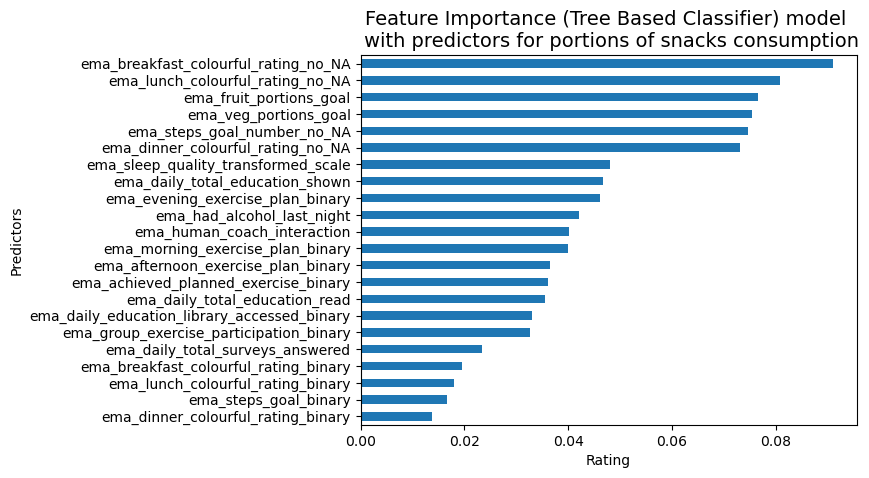

In [143]:
#Feature Importance for snacks
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for portions of snacks consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

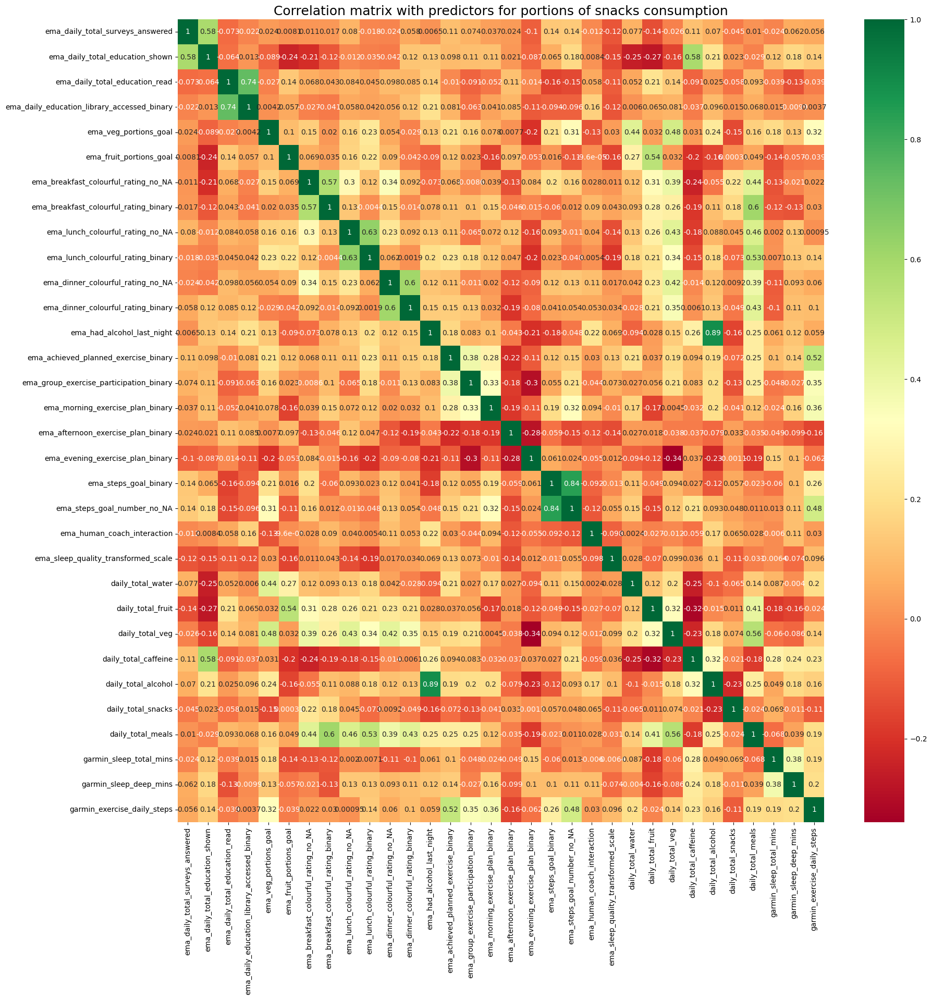

In [87]:
#Correlation Matrix with Heatmap for number of snacks
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for portions of snacks consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 19
Selected feature names: ['ema_daily_total_surveys_answered' 'ema_daily_total_education_shown'
 'ema_daily_total_education_read'
 'ema_daily_education_library_accessed_binary' 'ema_veg_portions_goal'
 'ema_fruit_portions_goal' 'ema_breakfast_colourful_rating_no_NA'
 'ema_lunch_colourful_rating_no_NA' 'ema_dinner_colourful_rating_no_NA'
 'ema_dinner_colourful_rating_binary' 'ema_had_alcohol_last_night'
 'ema_group_exercise_participation_binary'
 'ema_morning_exercise_plan_binary' 'ema_afternoon_exercise_plan_binary'
 'ema_evening_exercise_plan_binary' 'ema_steps_goal_binary'
 'ema_steps_goal_number_no_NA' 'ema_human_coach_interaction'
 'ema_sleep_quality_transformed_scale']


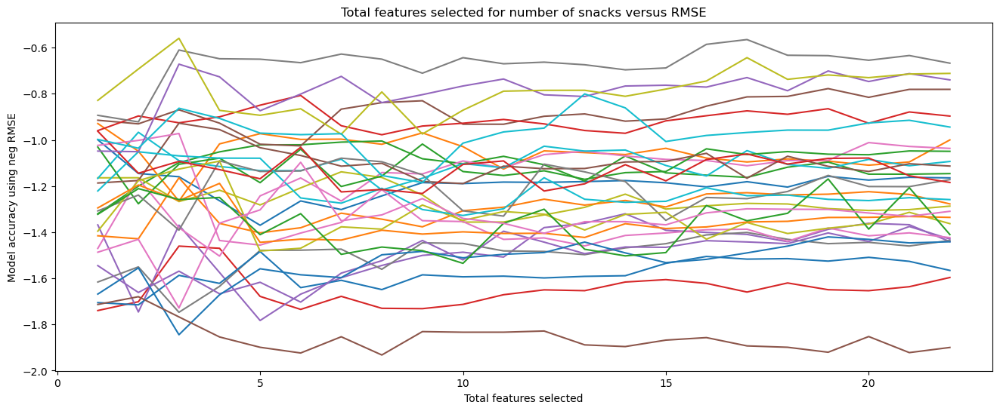

,Rank
ema_daily_total_surveys_answered,1
ema_steps_goal_number_no_NA,1
ema_steps_goal_binary,1
ema_evening_exercise_plan_binary,1
ema_afternoon_exercise_plan_binary,1
ema_morning_exercise_plan_binary,1
ema_group_exercise_participation_binary,1
ema_had_alcohol_last_night,1
ema_dinner_colourful_rating_binary,1
ema_human_coach_interaction,1


In [44]:
#using RFE feature selection for portions of snacks
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(900)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-5]    #target column snacks

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for number of snacks versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)

In [144]:
#Univariate Selection for number of meals feature selection
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column meals
#apply SelectKBest class to extract top 10 best features
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Predictors for number of meals consumption','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))  #print 10 best features

featureScores.to_excel('meals_univariate.xlsx', index=False)

   Predictors for number of meals consumption        Score
19                ema_steps_goal_number_no_NA  1631.654956
6        ema_breakfast_colourful_rating_no_NA   629.492951
8            ema_lunch_colourful_rating_no_NA   556.106835
10          ema_dinner_colourful_rating_no_NA   251.009599
2              ema_daily_total_education_read     8.179459
14    ema_group_exercise_participation_binary     7.871622
12                 ema_had_alcohol_last_night     7.343243
7       ema_breakfast_colourful_rating_binary     7.192821
9           ema_lunch_colourful_rating_binary     4.887807
13       ema_achieved_planned_exercise_binary     4.774775


[0.00873239 0.012924   0.01053192 0.00682237 0.02218711 0.02186217
 0.07188087 0.23141277 0.07563599 0.20436446 0.07249523 0.09724365
 0.01771969 0.01814638 0.017203   0.01228527 0.0098336  0.02023591
 0.00873944 0.02065946 0.01612792 0.02295641]


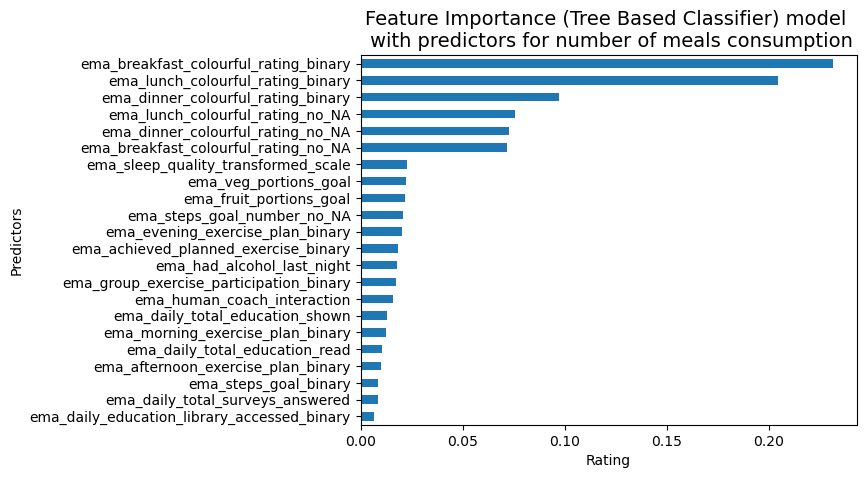

In [145]:
#Feature Importance for meals
import pandas as pd
import numpy as np
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column meals
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(X,y)
print(model.feature_importances_) #use inbuilt class feature_importances of tree based classifiers
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(22).plot(kind='barh')
plt.title('Feature Importance (Tree Based Classifier) model \n with predictors for number of meals consumption', loc='center', color='black', size=14)
plt.gca().invert_yaxis()
plt.xlabel("Rating")
plt.ylabel("Predictors")
plt.show()

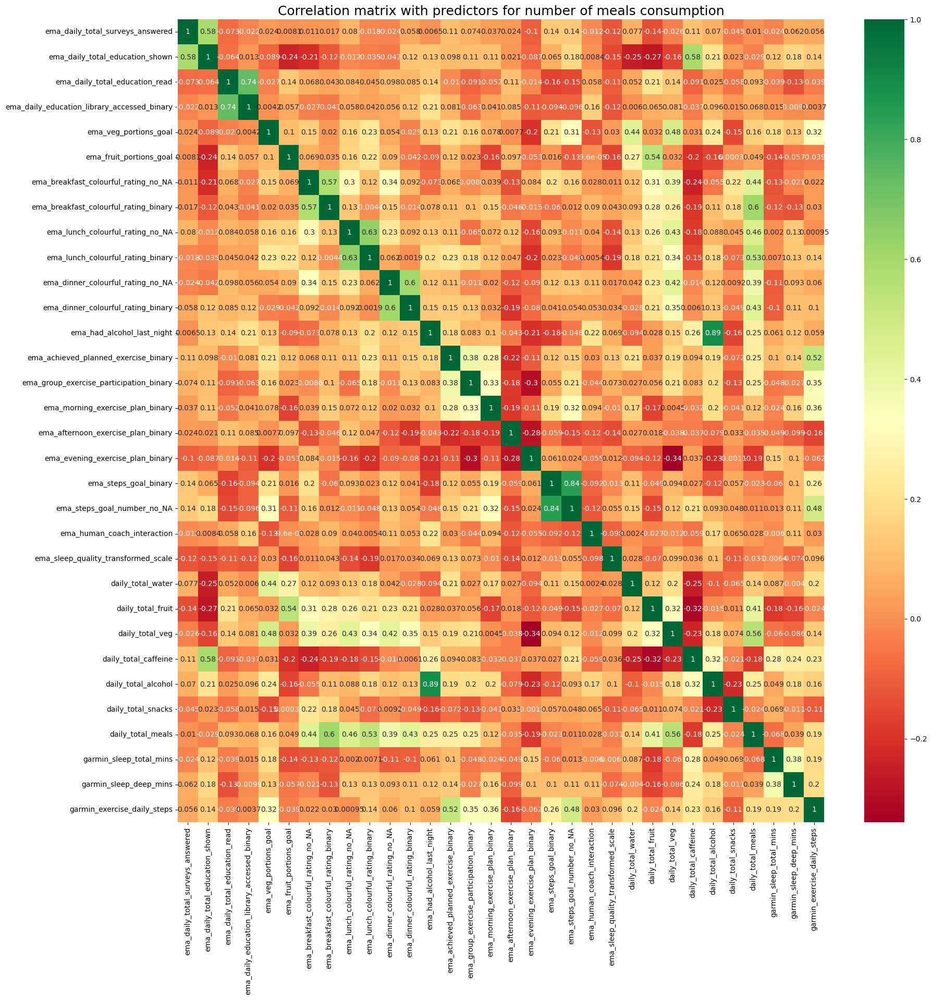

In [90]:
#Correlation Matrix with Heatmap for number of meals
import pandas as pd
import numpy as np
import seaborn as sns
data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column number of meals
#get correlations of each features in dataset
corrmat = data.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
plt.title('Correlation matrix with predictors for number of meals consumption', loc='center', color='black', size=18)
#plot heat map
g=sns.heatmap(data[top_corr_features].corr(),annot=True,cmap="RdYlGn")

Optimum number of features: 16
Selected feature names: ['ema_daily_total_education_shown' 'ema_daily_total_education_read'
 'ema_daily_education_library_accessed_binary' 'ema_fruit_portions_goal'
 'ema_breakfast_colourful_rating_no_NA'
 'ema_breakfast_colourful_rating_binary'
 'ema_lunch_colourful_rating_no_NA' 'ema_lunch_colourful_rating_binary'
 'ema_dinner_colourful_rating_no_NA' 'ema_dinner_colourful_rating_binary'
 'ema_achieved_planned_exercise_binary' 'ema_morning_exercise_plan_binary'
 'ema_evening_exercise_plan_binary' 'ema_steps_goal_number_no_NA'
 'ema_human_coach_interaction' 'ema_sleep_quality_transformed_scale']


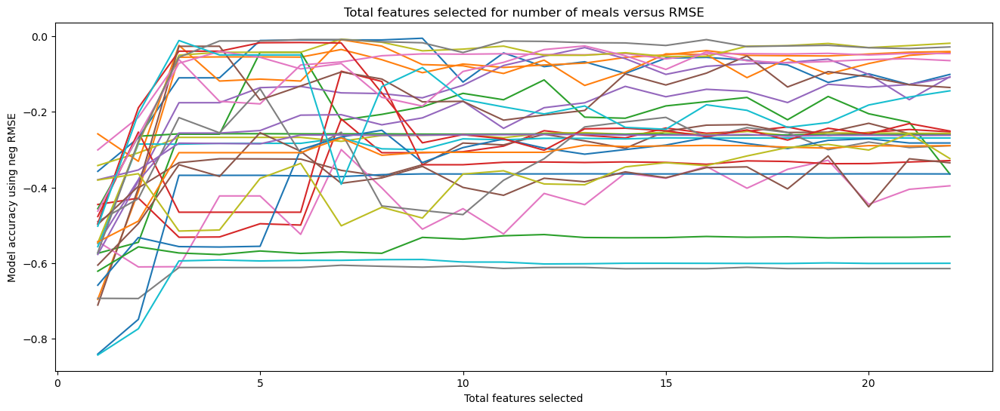

,Rank
ema_dinner_colourful_rating_no_NA,1
ema_steps_goal_number_no_NA,1
ema_evening_exercise_plan_binary,1
ema_morning_exercise_plan_binary,1
ema_achieved_planned_exercise_binary,1
ema_dinner_colourful_rating_binary,1
ema_human_coach_interaction,1
ema_lunch_colourful_rating_binary,1
ema_sleep_quality_transformed_scale,1
ema_breakfast_colourful_rating_binary,1


In [45]:
#using RFE feature selection for meals
import warnings
warnings.filterwarnings("ignore")
from sklearn.feature_selection import RFECV 
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import GradientBoostingRegressor
import matplotlib.pyplot as plt
import pandas as pd
import random

random.seed(1000)


data = pd.read_csv("C:/R_code/study4/dfPredictors.csv")
X = data.iloc[:,0:22]  #independent columns
y = data.iloc[:,-4]    #target column meals

rfecv = RFECV(estimator=GradientBoostingRegressor(), 
              step=1, 
              cv=RepeatedKFold(n_splits=10, n_repeats=3, random_state=1),
              scoring='neg_root_mean_squared_error')
rfecv.fit(X, y)
print("Optimum number of features: %d" % rfecv.n_features_)
print("Selected feature names:",rfecv.get_feature_names_out())

plt.figure( figsize=(16, 6))
plt.title('Total features selected for number of meals versus RMSE')
plt.xlabel('Total features selected')
plt.ylabel('Model accuracy using neg RMSE')
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_) 
plt.show()


rfecv_df = pd.DataFrame(rfecv.ranking_,index=X.columns,columns=['Rank']).sort_values(by='Rank',ascending=True)
rfecv_df.head(22)